# Pretrained Encoder (Bert Backbone)

### (Classification Using Resting-State fMRI Data )


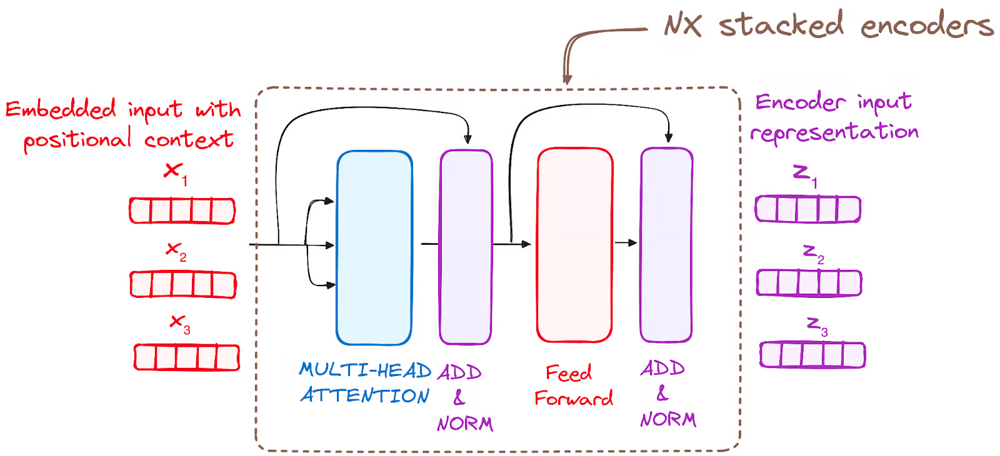
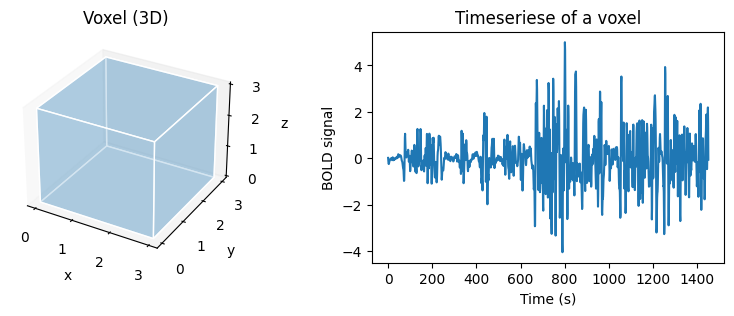
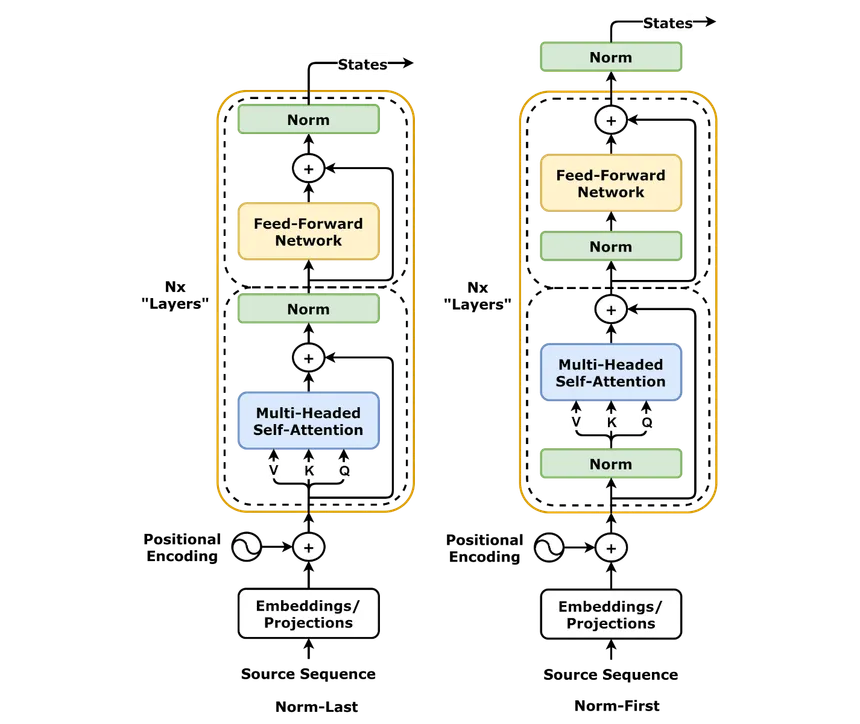
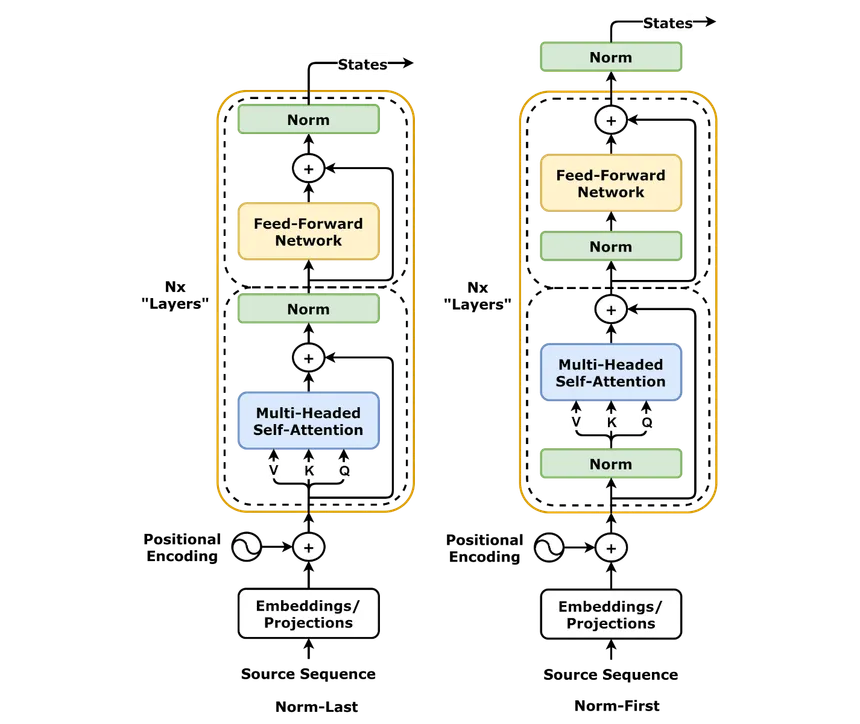
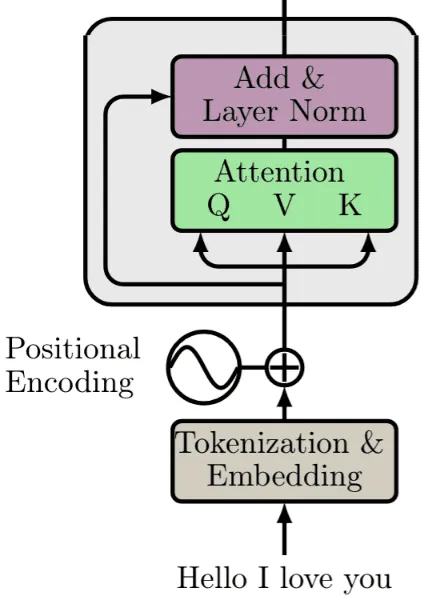
...
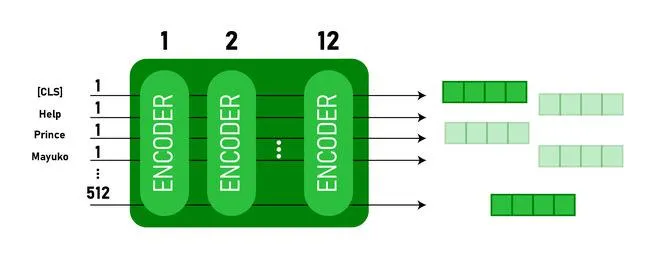
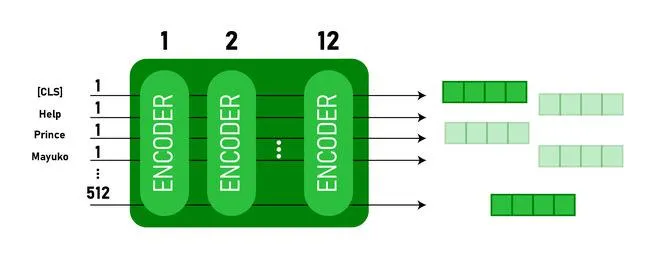
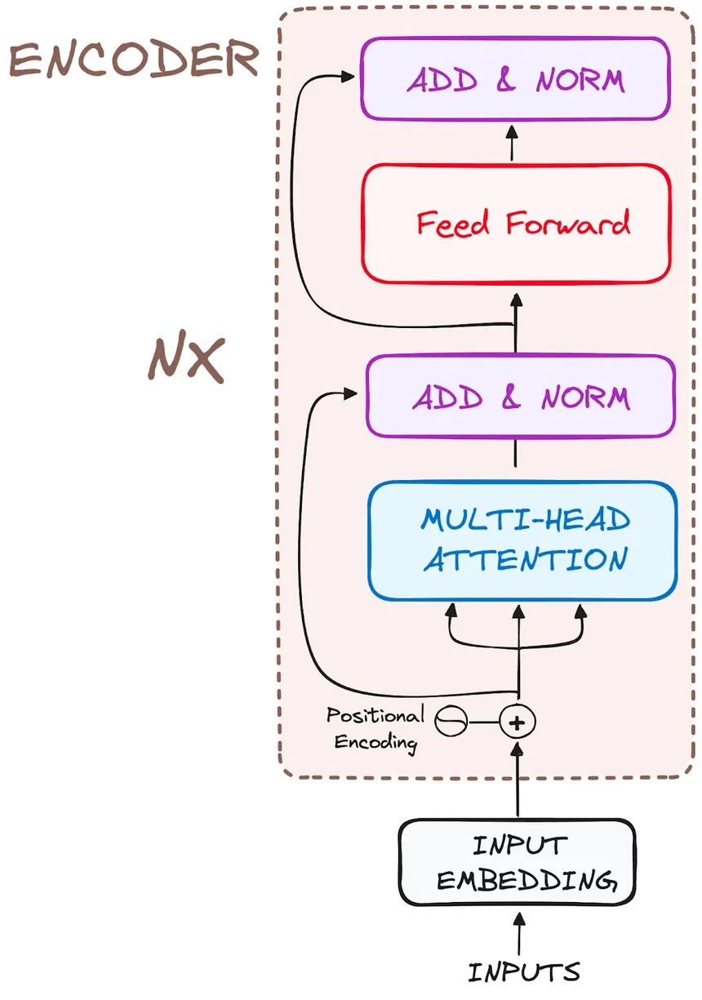
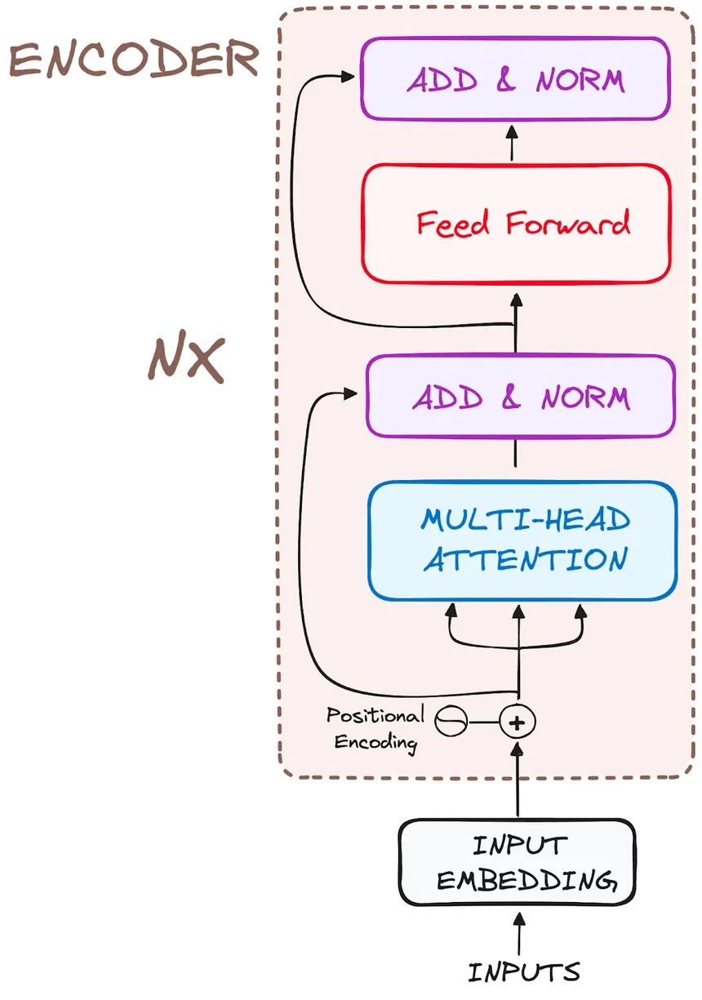
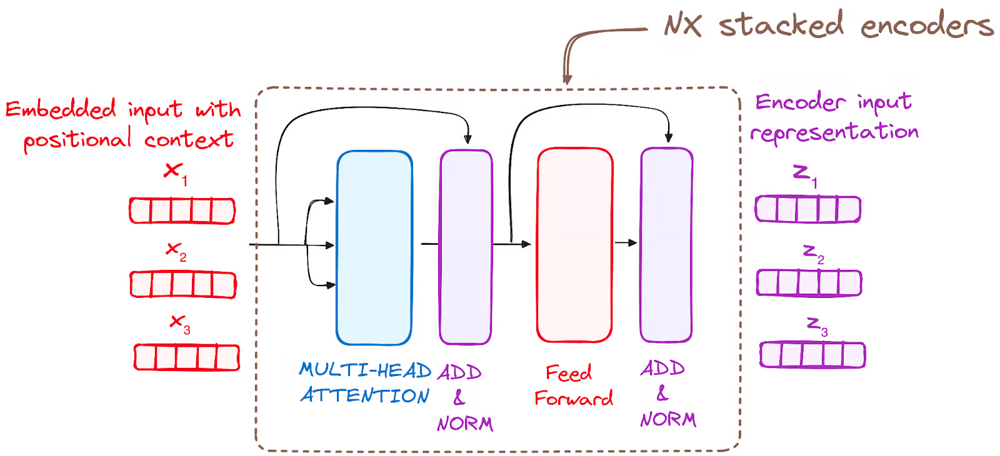

In [2]:
# Import necessary libraries

import os

import json

import numpy as np

import pandas as pd

import seaborn as sns

from glob import glob

from pathlib import Path

import matplotlib.pyplot as plt

import plotly.graph_objects as go

import matplotlib.patches as mpatches

from matplotlib import colormaps, colors

from nilearn import datasets, maskers, plotting

from nilearn.maskers import NiftiLabelsMasker

from nilearn.connectome import ConnectivityMeasure





# Ignore warnings for cleaner output

import warnings

warnings.filterwarnings('ignore')

In [3]:


!pip install --quiet torch-geometric
!pip install --quiet torch torchvision
!pip install --quiet optuna-integration
!pip install --quiet pytorch-ranger
!pip install --quiet torch_optimizer
!pip install --quiet transformers



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.7 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.6/97.6 kB 1.9 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.9/55.9 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 3.0 MB/s eta 0:00:00


In [4]:
# Import Torch libraries

import torch
import optuna
import torch.nn as nn
import torch.optim as optim
import torch_optimizer as optimizers
from torch.optim.lr_scheduler import CosineAnnealingLR
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score, confusion_matrix
from torch.utils.data import DataLoader, TensorDataset, random_split
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# 1 Abide Dataset

## **Load and explore the data**

### Target Variable ( Y )

In [5]:
csv_path = '/kaggle/input/abide-dataset/autism_pheno.csv'



pheno = pd.read_csv(csv_path)

In [6]:
# Filter relevant columns
relevant_columns = ['DX_GROUP', 'DSM_IV_TR', 'AGE_AT_SCAN', 'SEX']
pheno = pheno[relevant_columns]


In [7]:
# Convert DX_GROUP to binary (1=Autism, 0=Control)
pheno['DX_GROUP'] = pheno['DX_GROUP'].apply(lambda x: 1 if x == 1 else 0)


# Convert SEX to binary (1=Male, 0=Female)
pheno['SEX'] = pheno['SEX'].apply(lambda x: 1 if x == 1 else 0)

# Standardize AGE_AT_SCAN
scaler = StandardScaler()
pheno['AGE'] = scaler.fit_transform(pheno[['AGE_AT_SCAN']])

print(pheno['DX_GROUP'].value_counts())
print(pheno['DSM_IV_TR'].value_counts())
print(pheno['SEX'].value_counts())

DX_GROUP
0    468
1    403
Name: count, dtype: int64
DSM_IV_TR
 0       456
 1       258
 2        74
-9999     53
 3        29
 4         1
Name: count, dtype: int64
SEX
1    727
0    144
Name: count, dtype: int64


In [8]:
pheno.head()

,DX_GROUP,DSM_IV_TR,AGE_AT_SCAN,SEX,AGE
0,1,1,24.45,1,0.990732
1,1,1,19.09,1,0.283286
2,1,1,13.73,0,-0.424159
3,1,1,13.37,1,-0.471674
4,1,1,17.78,1,0.110385


### Independent Variables ( x )

In [9]:
# Load the features 



feat_file = '/kaggle/input/abide-dataset/Autism_Classf_featuress.npz' 

X_features = np.load(feat_file)['a']



print('Features shape:', X_features.shape)

Features shape: (871, 2016)


## Preprocess Data

In [10]:
# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

y_pheno = pheno['SEX']



# --- Dataset Creation ---

# Convert AGE_AT_SCAN, SEX, and DX_GROUP to PyTorch tensors
age_data = torch.tensor(pheno['AGE_AT_SCAN'].values, dtype=torch.float32)
sex_data = torch.tensor(pheno['DX_GROUP'].values, dtype=torch.float32)
labels = torch.tensor(y_pheno.values, dtype=torch.float32)

# Convert ROI features (fMRI connectivity) to a PyTorch tensor
roi_features = torch.tensor(X_features, dtype=torch.float32)  # Assuming X_features is preprocessed

# Create a PyTorch dataset combining all features
dataset = TensorDataset(roi_features, age_data, sex_data, labels)

# Split the dataset into training and testing sets
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_data, test_data = random_split(dataset, [train_size, test_size])

# Create DataLoaders for batching
batch_size = 256
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)


Using device: cuda


## Transformer Class

In [11]:
import torch
import torch.nn as nn
from transformers import AutoConfig, AutoModel


class TransformerModel(nn.Module):
    def __init__(self, roi_input_dim, embed_dim, num_heads, num_layers, dropout_rate, pretrained_model_name="bert-base-uncased"):
        super(TransformerModel, self).__init__()

        # Ensure embed_dim is divisible by num_heads
        if embed_dim % num_heads != 0:
            embed_dim = (embed_dim // num_heads) * num_heads
            print(f"Adjusted embed_dim to {embed_dim} to ensure divisibility by num_heads.")

        # Embedding layers for age and gender
        self.age_mlp = nn.Sequential(
            nn.Linear(1, embed_dim),
            nn.GELU(),
            nn.BatchNorm1d(embed_dim),
            nn.Dropout(dropout_rate),
            nn.Linear(embed_dim, embed_dim),
        )
        self.gender_embed = nn.Embedding(2, embed_dim)

        # ROI encoder
        self.roi_encoder = nn.Sequential(
            nn.Linear(roi_input_dim, embed_dim),
            nn.GELU(),
            nn.BatchNorm1d(embed_dim),
            nn.Linear(embed_dim, embed_dim),
            nn.Dropout(dropout_rate),
        )

        # Hugging Face Transformer Model
        config = AutoConfig.from_pretrained(pretrained_model_name)
        config.hidden_size = embed_dim
        config.num_attention_heads = num_heads
        config.num_hidden_layers = num_layers
        config.hidden_dropout_prob = dropout_rate
        config.attention_probs_dropout_prob = dropout_rate
        self.transformer = AutoModel.from_config(config)

        # Attention pooling
        self.attention_pool = nn.Sequential(
            nn.Linear(embed_dim, embed_dim // 2),
            nn.GELU(),  # Replaced Mish() with GELU() for TorchScript compatibility
            nn.Linear(embed_dim // 2, 1),
            nn.Softmax(dim=1),
        )

        # Output layer
        self.output_layer = nn.Linear(embed_dim, 1)

    def forward(self, roi_data, age, gender):
        # Ensure gender is long dtype
        gender = gender.to(dtype=torch.long)

        # Encode inputs
        age_embed = self.age_mlp(age.unsqueeze(-1))
        gender_embed = self.gender_embed(gender)
        roi_encoded = self.roi_encoder(roi_data)

        # Combine inputs for transformer
        combined_input = torch.stack((roi_encoded, age_embed, gender_embed), dim=1)
        transformer_output = self.transformer(inputs_embeds=combined_input).last_hidden_state

        # Attention pooling
        attention_weights = self.attention_pool(transformer_output)
        pooled_output = (attention_weights * transformer_output).sum(dim=1)

        return self.output_layer(pooled_output).squeeze(1)

# Example usage
# model = TransformerModel(roi_input_dim=100, embed_dim=128, num_heads=8, num_layers=4, dropout_rate=0.1)




In [12]:
# Hyperparameters
best_params = {
    "embed_dim": 768,
    "num_heads": 32,
    "num_layers": 12,
    "dropout_rate": 0.119,
    "lr": 3.66e-5,
}


In [13]:
# Load pretrained weights
model_path = "/kaggle/input/bert-encoder-fmri/pytorch/default/3/fmri_encoder_3.0model.pth"

# model_path = "/kaggle/working/fmri_encoder_model4.pth"
state_dict = torch.load(model_path, map_location=device)

In [14]:
## --- Training and Validation Loop ---
# Define the best hyperparameters from Optuna study
#best_params = study.best_params

# Initialize the model with the best hyperparameters from Optuna
model = TransformerModel(
    roi_input_dim=roi_features.shape[1],
    embed_dim=best_params["embed_dim"],
    num_heads=best_params["num_heads"],
    num_layers=best_params["num_layers"],  # Optuna-tuned
    dropout_rate=best_params["dropout_rate"],
    pretrained_model_name="bert-base-uncased",  # Pretrained transformer model
).to(device)





# Fixed or reduced parameters
weight_decay = 1e-4
patience = 50


# Compute class weights for imbalance
pos_weight = torch.tensor([len(y_pheno) / y_pheno.sum() - 1], dtype=torch.float32).to(device)
criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

optimizer = optimizers.Ranger(model.parameters(), lr=best_params["lr"], weight_decay=weight_decay)
scheduler = CosineAnnealingLR(optimizer, T_max=10, eta_min=0)


# Early stopping parameters
best_val_loss = float("inf")
patience = patience  # Default patience if not specified
counter = 0
num_epochs = 10000
gradient_clip = 5.0  # Gradient clipping

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

In [15]:
# Training and validation loop
for epoch in range(num_epochs):
    # Training phase
    model.train()
    train_loss = 0
    for roi_data, age, gender, y in train_loader:
        # Move data to device
        roi_data, age, gender, y = roi_data.to(device), age.to(device), gender.to(device), y.to(device)

        # Forward pass
        optimizer.zero_grad()
        outputs = model(roi_data, age, gender)
        loss = criterion(outputs, y)
        loss.backward()

        # Clip gradients to avoid exploding gradients
        nn.utils.clip_grad_norm_(model.parameters(), max_norm=gradient_clip)
        optimizer.step()

        train_loss += loss.item()

    # Validation phase
    model.eval()
    val_loss = 0
    all_labels, all_preds = [], []
    with torch.no_grad():
        for roi_data, age, gender, y in test_loader:
            roi_data, age, gender, y = roi_data.to(device), age.to(device), gender.to(device), y.to(device)
            outputs = model(roi_data, age, gender)
            loss = criterion(outputs, y)
            val_loss += loss.item()

            # Collect predictions for metrics
            probs = torch.sigmoid(outputs)
            preds = (probs >= 0.5).float()
            all_labels.extend(y.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    # Average losses
    train_loss /= len(train_loader)
    val_loss /= len(test_loader)

    # Step the scheduler
    scheduler.step()

    # Compute metrics: Accuracy, AUC, F1
    accuracy = accuracy_score(all_labels, all_preds)
    roc_auc = roc_auc_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)

    # Log epoch details
    print(
        f"Epoch {epoch + 1}/{num_epochs} | "
        f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | "
        f"Accuracy: {accuracy:.4f} | AUC: {roc_auc:.4f} | F1: {f1:.4f}"
    )

    # Save the best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "best_transformer_model.pth")
        print(f"Saved new best model at epoch {epoch + 1}")
        counter = 0  # Reset early stopping counter
    else:
        counter += 1
        if counter >= patience:
            print("Early stopping triggered...")
            break

print("Training complete!")


Epoch 1/10000 | Train Loss: 0.2260 | Val Loss: 0.2367 | Accuracy: 0.3943 | AUC: 0.5566 | F1: 0.4479
Saved new best model at epoch 1
Epoch 2/10000 | Train Loss: 0.2316 | Val Loss: 0.2371 | Accuracy: 0.4457 | AUC: 0.5396 | F1: 0.5359
Epoch 3/10000 | Train Loss: 0.2286 | Val Loss: 0.2376 | Accuracy: 0.5886 | AUC: 0.5057 | F1: 0.7165
Epoch 4/10000 | Train Loss: 0.2253 | Val Loss: 0.2379 | Accuracy: 0.5600 | AUC: 0.5246 | F1: 0.6831
Epoch 5/10000 | Train Loss: 0.2279 | Val Loss: 0.2366 | Accuracy: 0.6457 | AUC: 0.5770 | F1: 0.7597
Saved new best model at epoch 5
Epoch 6/10000 | Train Loss: 0.2200 | Val Loss: 0.2341 | Accuracy: 0.5886 | AUC: 0.5663 | F1: 0.7049
Saved new best model at epoch 6
Epoch 7/10000 | Train Loss: 0.2231 | Val Loss: 0.2303 | Accuracy: 0.6114 | AUC: 0.6046 | F1: 0.7213
Saved new best model at epoch 7
Epoch 8/10000 | Train Loss: 0.2208 | Val Loss: 0.2294 | Accuracy: 0.5886 | AUC: 0.6148 | F1: 0.6949
Saved new best model at epoch 8
Epoch 9/10000 | Train Loss: 0.2232 | Val

## Evaluate the Model

In [16]:
# Load the best model
model.eval()

# Initialize lists to store predictions and ground truth labels
test_labels, test_preds, test_probs = [], [], []

# Evaluate the model
with torch.no_grad():
    for roi_data, age, gender, y in test_loader:
        # Move data to the device
        roi_data, age, gender, y = roi_data.to(device), age.to(device), gender.to(device), y.to(device)

        # Get model predictions
        outputs = model(roi_data, age, gender)  # Logits
        probs = torch.sigmoid(outputs)              # Probabilities
        preds = (probs >= 0.5).float()              # Apply threshold for binary classification

        # Store predictions and labels
        test_labels.extend(y.cpu().numpy())
        test_preds.extend(preds.cpu().numpy())
        test_probs.extend(probs.cpu().numpy())

# Convert to numpy arrays
test_labels = np.array(test_labels)
test_preds = np.array(test_preds)
test_probs = np.array(test_probs)

# Compute metrics
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(test_labels, test_preds)
roc_auc = roc_auc_score(test_labels, test_probs)  # Use probabilities for AUC
precision = precision_score(test_labels, test_preds)
recall = recall_score(test_labels, test_preds)
f1 = f1_score(test_labels, test_preds)

# Print metrics
print(f"Test Results:\n"
      f"Accuracy: {accuracy:.4f}\n"
      f"AUC-ROC: {roc_auc:.4f}\n"
      f"Precision: {precision:.4f}\n"
      f"Recall: {recall:.4f}\n"
      f"F1 Score: {f1:.4f}")


Test Results:
Accuracy: 0.7543
AUC-ROC: 0.6761
Precision: 0.8425
Recall: 0.8601
F1 Score: 0.8512


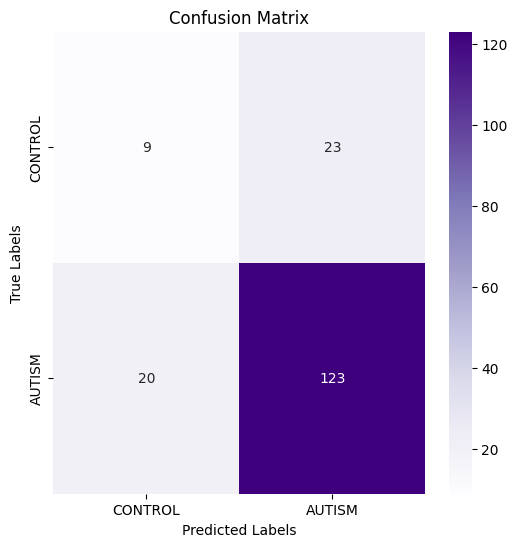

In [17]:
# Confusion Matrix


conf_matrix = confusion_matrix(test_labels, test_preds)

# Plot Confusion Matrix

plt.figure(figsize=(6, 6))

sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Purples", xticklabels=['CONTROL', 'AUTISM'], 

            yticklabels=['CONTROL', 'AUTISM'])

plt.title('Confusion Matrix')

plt.ylabel('True Labels')

plt.xlabel('Predicted Labels')

plt.show()

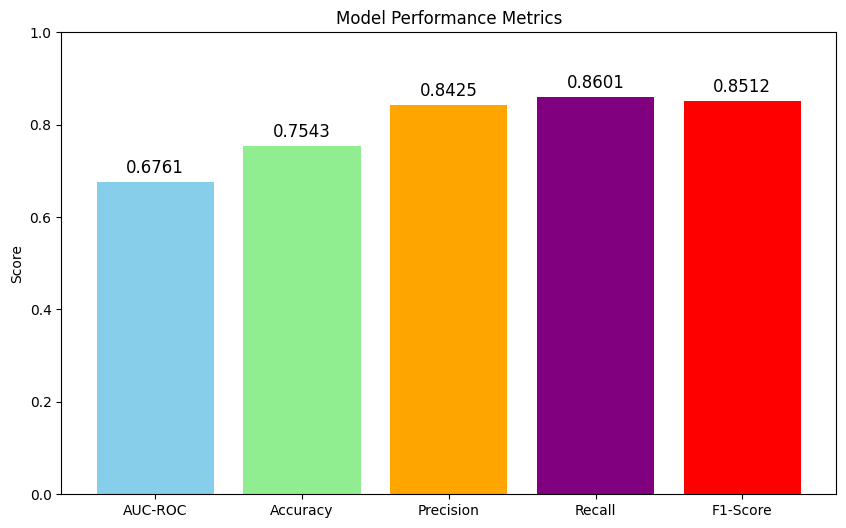

In [18]:
metrics = {'AUC-ROC': roc_auc, 'Accuracy': accuracy, 'Precision': precision, 'Recall': recall, 'F1-Score': f1}

metric_names = list(metrics.keys())

metric_values = list(metrics.values())



plt.figure(figsize=(10, 6))

plt.bar(metric_names, metric_values, color=['skyblue', 'lightgreen', 'orange', 'purple', 'red'])

plt.title("Model Performance Metrics")

plt.ylabel("Score")

plt.ylim(0, 1)  # As all scores are in [0, 1]

for i, v in enumerate(metric_values):

    plt.text(i, v + 0.02, f"{v:.4f}", ha='center', fontsize=12)

plt.show()

In [19]:
# Save the model
torch.save(model.state_dict(), "fmri_encoder_model4.pth")
print("Model saved successfully.")


Model saved successfully.


In [20]:
stop

NameError: name 'stop' is not defined

In [ ]:
import torch
import torch.nn as nn


    
# Force torch to use CPU only
device = torch.device("cpu")
model.to(device)

# Before saving TorchScript, REMOVE DataParallel!
if isinstance(model, nn.DataParallel):
    model = model.module  # Unwrap the model

batch_size = 2  # Must be > 1 to avoid BatchNorm error

# Adjust dummy inputs to match the real data
dummy_roi = torch.randn(batch_size, 2016).to(device)  # Adjusted for expected input shape (batch_size, 100)
dummy_age = torch.randint(0, 100, (batch_size,)).to(device).float()  # Age as float
dummy_gender = torch.randint(0, 2, (batch_size,)).to(device)  # Gender as long (0 or 1)

# Now trace the model
scripted_model = torch.jit.trace(model, (dummy_roi, dummy_age, dummy_gender))
scripted_model.save("fmri_encoder_commercial.pt")

print("Model successfully saved!")


# 2 Pixar Dataset

In [ ]:
# Load the data 

csv_path2 = '/kaggle/input/pixar/pixar_pheno.csv'

new_pheno = pd.read_csv(csv_path2)



feat_file2 = '/kaggle/input/pixar/pixar_features.npz' 
new_X_features = np.load(feat_file2)['a']

print('Features shape:', new_X_features.shape)
print('Pheno shape:', new_pheno.shape)



In [ ]:
new_pheno.sample()

In [ ]:
# Device selection: DirectML or fallback to CUDA/CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize LabelEncoder
label_encoder = LabelEncoder()
new_pheno['Male'] = label_encoder.fit_transform(new_pheno['Gender'])
new_pheno['Child'] = label_encoder.fit_transform(new_pheno['Child_Adult'])

new_y = new_pheno['Male']

# Convert new data to PyTorch tensors
new_age_data = torch.tensor(new_pheno['Age'].values, dtype=torch.float32)
new_sex_data = torch.tensor(new_pheno['Child'], dtype=torch.float32)
new_labels = torch.tensor(new_y, dtype=torch.float32)
new_roi_features = torch.tensor(new_X_features, dtype=torch.float32)

# Create a PyTorch dataset
new_dataset = TensorDataset(new_roi_features, new_age_data, new_sex_data, new_labels)

# Split the dataset into training and testing sets
train_size = int(0.8 * len(new_dataset))
test_size = len(new_dataset) - train_size
new_train_data, new_test_data = random_split(new_dataset, [train_size, test_size])

# Create DataLoaders
new_batch_size = 256
new_train_loader = DataLoader(new_train_data, batch_size=new_batch_size, shuffle=True, num_workers=4, pin_memory=True)
new_test_loader = DataLoader(new_test_data, batch_size=new_batch_size, shuffle=False, num_workers=4, pin_memory=True)


In [ ]:
import torch
import torch.nn as nn
from transformers import AutoConfig, AutoModel


class TransformerModel(nn.Module):
    def __init__(self, roi_input_dim, embed_dim, num_heads, num_layers, dropout_rate, pretrained_model_name="bert-base-uncased"):
        super(TransformerModel, self).__init__()

        # Ensure embed_dim is divisible by num_heads
        if embed_dim % num_heads != 0:
            embed_dim = (embed_dim // num_heads) * num_heads
            print(f"Adjusted embed_dim to {embed_dim} to ensure divisibility by num_heads.")

        # Embedding layers for age and gender
        self.age_mlp = nn.Sequential(
            nn.Linear(1, embed_dim),
            nn.GELU(),
            nn.BatchNorm1d(embed_dim),
            nn.Dropout(dropout_rate),
            nn.Linear(embed_dim, embed_dim),
        )
        self.gender_embed = nn.Embedding(2, embed_dim)

        # ROI encoder
        self.roi_encoder = nn.Sequential(
            nn.Linear(roi_input_dim, embed_dim),
            nn.GELU(),
            nn.BatchNorm1d(embed_dim),
            nn.Linear(embed_dim, embed_dim),
            nn.Dropout(dropout_rate),
        )

        # Hugging Face Transformer Model
        config = AutoConfig.from_pretrained(pretrained_model_name)
        config.hidden_size = embed_dim
        config.num_attention_heads = num_heads
        config.num_hidden_layers = num_layers
        config.hidden_dropout_prob = dropout_rate
        config.attention_probs_dropout_prob = dropout_rate
        self.transformer = AutoModel.from_config(config)

        # Attention pooling
        self.attention_pool = nn.Sequential(
            nn.Linear(embed_dim, embed_dim // 2),
            nn.GELU(),  # Replaced Mish() with GELU() for TorchScript compatibility
            nn.Linear(embed_dim // 2, 1),
            nn.Softmax(dim=1),
        )

        # Output layer
        self.output_layer = nn.Linear(embed_dim, 1)

    def forward(self, roi_data, age, gender):
        # Ensure gender is long dtype
        gender = gender.to(dtype=torch.long)

        # Encode inputs
        age_embed = self.age_mlp(age.unsqueeze(-1))
        gender_embed = self.gender_embed(gender)
        roi_encoded = self.roi_encoder(roi_data)

        # Combine inputs for transformer
        combined_input = torch.stack((roi_encoded, age_embed, gender_embed), dim=1)
        transformer_output = self.transformer(inputs_embeds=combined_input).last_hidden_state

        # Attention pooling
        attention_weights = self.attention_pool(transformer_output)
        pooled_output = (attention_weights * transformer_output).sum(dim=1)

        return self.output_layer(pooled_output).squeeze(1)

# Example usage
# model = TransformerModel(roi_input_dim=100, embed_dim=128, num_heads=8, num_layers=4, dropout_rate=0.1)




In [ ]:
## --- Training and Validation Loop ---
# Define the best hyperparameters from Optuna study
#best_params = study.best_params

# Initialize the model with the best hyperparameters from Optuna
model = TransformerModel(
    roi_input_dim=roi_features.shape[1],
    embed_dim=best_params["embed_dim"],
    num_heads=best_params["num_heads"],
    num_layers=best_params["num_layers"],  # Optuna-tuned
    dropout_rate=best_params["dropout_rate"],
    pretrained_model_name="bert-base-uncased"  # Pretrained transformer model
).to(device)






In [ ]:
# Fixed or reduced parameters
weight_decay = 1e-4
patience = 250

# Compute class weights for imbalance
pos_weight = torch.tensor([len(new_y) / new_y.sum() - 1], dtype=torch.float32).to(device)
criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

optimizer = optimizers.Ranger(model.parameters(), lr=best_params["lr"], weight_decay=weight_decay)
scheduler = CosineAnnealingLR(optimizer, T_max=10, eta_min=0)


In [ ]:
# Load the saved model weights
model.load_state_dict(torch.load("fmri_encoder_model.pth"))

## Train the Saved Model

In [ ]:
# --- Training and Validation Loop ---

# Early stopping parameters
best_val_loss = float("inf")
patience = patience  # Default patience if not specified
counter = 0
num_epochs = 1000
gradient_clip = 1.0  # Gradient clipping

# Training and validation loop
for epoch in range(num_epochs):
    # Training phase
    model.train()
    train_loss = 0
    for roi_data, age, gender, y in new_train_loader:  # Use new_train_loader here
        # Move data to device
        roi_data, age, gender, y = roi_data.to(device), age.to(device), gender.to(device), y.to(device)

        # Forward pass
        optimizer.zero_grad()
        outputs = model(roi_data, age, gender)
        loss = criterion(outputs, y)
        loss.backward()

        # Clip gradients to avoid exploding gradients
        nn.utils.clip_grad_norm_(model.parameters(), max_norm=gradient_clip)
        optimizer.step()

        train_loss += loss.item()

    # Validation phase
    model.eval()
    val_loss = 0
    all_labels, all_preds = [], []
    with torch.no_grad():
        for roi_data, age, gender, y in new_test_loader:  # Use new_test_loader here
            roi_data, age, gender, y = roi_data.to(device), age.to(device), gender.to(device), y.to(device)
            outputs = model(roi_data, age, gender)
            loss = criterion(outputs, y)
            val_loss += loss.item()

            # Collect predictions for metrics
            probs = torch.sigmoid(outputs)
            preds = (probs >= 0.5).float()
            all_labels.extend(y.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    # Average losses
    train_loss /= len(new_train_loader)  # Use new_train_loader
    val_loss /= len(new_test_loader)    # Use new_test_loader

    # Step the scheduler
    scheduler.step()

    # Compute metrics: Accuracy, AUC, F1
    accuracy = accuracy_score(all_labels, all_preds)
    roc_auc = roc_auc_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)

    # Log epoch details
    print(
        f"Epoch {epoch + 1}/{num_epochs} | "
        f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | "
        f"Accuracy: {accuracy:.4f} | AUC: {roc_auc:.4f} | F1: {f1:.4f}"
    )

    # Save the best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "best_transformer_model.pth")
        print(f"Saved new best model at epoch {epoch + 1}")
        counter = 0  # Reset early stopping counter
    else:
        counter += 1
        if counter >= patience:
            print("Early stopping triggered...")
            break

print("Training complete!")


In [ ]:
# Load the best model
model.eval()

# Initialize lists to store predictions and ground truth labels
test_labels, test_preds, test_probs = [], [], []

# Evaluate the model
with torch.no_grad():
    for roi_data, age, gender, y in new_test_loader:  # Use new_test_loader here
        # Move data to the device
        roi_data, age, gender, y = roi_data.to(device), age.to(device), gender.to(device), y.to(device)

        # Get model predictions
        outputs = model(roi_data, age, gender)  # Logits
        probs = torch.sigmoid(outputs)           # Probabilities
        preds = (probs >= 0.5).float()           # Apply threshold for binary classification

        # Store predictions and labels
        test_labels.extend(y.cpu().numpy())
        test_preds.extend(preds.cpu().numpy())
        test_probs.extend(probs.cpu().numpy())

# Convert to numpy arrays
test_labels = np.array(test_labels)
test_preds = np.array(test_preds)
test_probs = np.array(test_probs)

# Compute metrics
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(test_labels, test_preds)
roc_auc = roc_auc_score(test_labels, test_probs)  # Use probabilities for AUC
precision = precision_score(test_labels, test_preds)
recall = recall_score(test_labels, test_preds)
f1 = f1_score(test_labels, test_preds)

# Print metrics
print(f"Test Results:\n"
      f"Accuracy: {accuracy:.4f}\n"
      f"AUC-ROC: {roc_auc:.4f}\n"
      f"Precision: {precision:.4f}\n"
      f"Recall: {recall:.4f}\n"
      f"F1 Score: {f1:.4f}")


In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Confusion Matrix
conf_matrix = confusion_matrix(test_labels, test_preds)

# Plot Confusion Matrix
plt.figure(figsize=(6, 6))

sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Purples", xticklabels=['Adult', 'Child'], 
            yticklabels=['Adult', 'Child'])

plt.title('Confusion Matrix')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')

plt.show()

In [ ]:
# Metrics Dictionary
metrics = {'AUC-ROC': roc_auc, 'Accuracy': accuracy, 'Precision': precision, 'Recall': recall, 'F1-Score': f1}
metric_names = list(metrics.keys())
metric_values = list(metrics.values())

# Plot Metrics Bar Chart
plt.figure(figsize=(12, 6))
plt.bar(metric_names, metric_values, color=['skyblue', 'lightgreen', 'orange', 'purple', 'red'])
plt.title("Model Performance Metrics")
plt.ylabel("Score")
plt.ylim(0, 1)  # As all scores are in [0, 1]

# Add value annotations to the bars
for i, v in enumerate(metric_values):
    plt.text(i, v + 0.02, f"{v:.4f}", ha='center', fontsize=12)

plt.show()

In [ ]:
# Save the model
torch.save(model.state_dict(), "fmri_encoder_model_v2.pth")
print("Model saved successfully.")


In [ ]:
import torch
import torch.nn as nn

# Check if multiple GPUs are available
if torch.cuda.device_count() > 1:
    print(f"Using {torch.cuda.device_count()} GPUs!")
    model = nn.DataParallel(model)  # Wrap model for multi-GPU training

# Move model to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Before saving TorchScript, REMOVE DataParallel!
if isinstance(model, nn.DataParallel):
    model = model.module  # Unwrap the model

batch_size = 2  # Must be > 1 to avoid BatchNorm error

# Adjust dummy inputs to match the real data
dummy_roi = torch.randn(batch_size, 100).to(device)  # Adjusted for expected input shape (batch_size, 100)
dummy_age = torch.randint(0, 100, (batch_size,)).to(device).float()  # Age as float
dummy_gender = torch.randint(0, 2, (batch_size,)).to(device)  # Gender as long (0 or 1)

# Now trace the model
scripted_model = torch.jit.trace(model, (dummy_roi, dummy_age, dummy_gender))
scripted_model.save("fmri_encoder_commercial.pt")

print("Model successfully saved!")


# 3 Adhd Dataset

In [ ]:
# Load the data 

new_pheno = pd.read_csv('/kaggle/input/adhd-dataset/adhd_phenotype') 
new_pheno = new_pheno[['tdc','adhd','age','sex']]

feat_file = '/kaggle/input/adhd-dataset/ADHD_Difumo_features.npz' 
new_X_features = np.load(feat_file)['a']

print('Features shape:', new_X_features.shape)
print('Pheno shape:', new_pheno.shape)

In [ ]:
# Initialize LabelEncoder
label_encoder = LabelEncoder()
new_pheno['male'] = label_encoder.fit_transform(new_pheno['sex'])



In [ ]:
# Device selection: DirectML or fallback to CUDA/CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

new_y = new_pheno['male']

# Convert new data to PyTorch tensors
new_age_data = torch.tensor(new_pheno['age'].values, dtype=torch.float32)
new_sex_data = torch.tensor(new_pheno['adhd'], dtype=torch.float32)
new_labels = torch.tensor(new_y, dtype=torch.float32)
new_roi_features = torch.tensor(new_X_features, dtype=torch.float32)

# Create a PyTorch dataset
new_dataset = TensorDataset(new_roi_features, new_age_data, new_sex_data, new_labels)

# Split the dataset into training and testing sets
train_size = int(0.6 * len(new_dataset))
test_size = len(new_dataset) - train_size
new_train_data, new_test_data = random_split(new_dataset, [train_size, test_size])

# Create DataLoaders
new_batch_size = 256
new_train_loader = DataLoader(new_train_data, batch_size=new_batch_size, shuffle=True, num_workers=4, pin_memory=True)
new_test_loader = DataLoader(new_test_data, batch_size=new_batch_size, shuffle=False, num_workers=4, pin_memory=True)


In [ ]:
## --- Training and Validation Loop ---

# Initialize the model with the best hyperparameters from Optuna
model = TransformerModel(
    roi_input_dim=roi_features.shape[1],
    embed_dim=best_params["embed_dim"],
    num_heads=best_params["num_heads"],
    num_layers=best_params["num_layers"],  # Optuna-tuned
    dropout_rate=best_params["dropout_rate"],
    pretrained_model_name="bert-base-uncased"
).to(device)





# Fixed or reduced parameters
weight_decay = 1e-4


# Compute class weights for imbalance
pos_weight = torch.tensor([len(new_y) / new_y.sum() - 1], dtype=torch.float32).to(device)
criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

optimizer = optimizers.Ranger(model.parameters(), lr=best_params["lr"], weight_decay=weight_decay)
scheduler = CosineAnnealingLR(optimizer, T_max=10, eta_min=0)


# Early stopping parameters
best_val_loss = float("inf")
patience = 250 # Default patience if not specified
counter = 0
num_epochs = 10000
gradient_clip = 1.0  # Gradient clipping



In [ ]:
# Load the saved model weights
model.load_state_dict(torch.load("fmri_encoder_model_v2.pth"))

## Train the Model

In [ ]:
# --- Training and Validation Loop ---

# Early stopping parameters
best_val_loss = float("inf")
patience = patience  # Default patience if not specified
counter = 0
num_epochs = 10000
gradient_clip = 1.0  # Gradient clipping

# Training and validation loop
for epoch in range(num_epochs):
    # Training phase
    model.train()
    train_loss = 0
    for roi_data, age, gender, y in new_train_loader:  # Use new_train_loader here
        # Move data to device
        roi_data, age, gender, y = roi_data.to(device), age.to(device), gender.to(device), y.to(device)

        # Forward pass
        optimizer.zero_grad()
        outputs = model(roi_data, age, gender)
        loss = criterion(outputs, y)
        loss.backward()

        # Clip gradients to avoid exploding gradients
        nn.utils.clip_grad_norm_(model.parameters(), max_norm=gradient_clip)
        optimizer.step()

        train_loss += loss.item()

    # Validation phase
    model.eval()
    val_loss = 0
    all_labels, all_preds = [], []
    with torch.no_grad():
        for roi_data, age, gender, y in new_test_loader:  # Use new_test_loader here
            roi_data, age, gender, y = roi_data.to(device), age.to(device), gender.to(device), y.to(device)
            outputs = model(roi_data, age, gender)
            loss = criterion(outputs, y)
            val_loss += loss.item()

            # Collect predictions for metrics
            probs = torch.sigmoid(outputs)
            preds = (probs >= 0.5).float()
            all_labels.extend(y.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    # Average losses
    train_loss /= len(new_train_loader)  # Use new_train_loader
    val_loss /= len(new_test_loader)    # Use new_test_loader

    # Step the scheduler
    scheduler.step()

    # Compute metrics: Accuracy, AUC, F1
    accuracy = accuracy_score(all_labels, all_preds)
    roc_auc = roc_auc_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)

    # Log epoch details
    print(
        f"Epoch {epoch + 1}/{num_epochs} | "
        f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | "
        f"Accuracy: {accuracy:.4f} | AUC: {roc_auc:.4f} | F1: {f1:.4f}"
    )

    # Save the best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "best_transformer_model.pth")
        print(f"Saved new best model at epoch {epoch + 1}")
        counter = 0  # Reset early stopping counter
    else:
        counter += 1
        if counter >= patience:
            print("Early stopping triggered...")
            break

print("Training complete!")


## Evaluate the Model

In [ ]:
# Load the best model
model.eval()

# Initialize lists to store predictions and ground truth labels
test_labels, test_preds, test_probs = [], [], []

# Evaluate the model
with torch.no_grad():
    for roi_data, age, gender, y in new_test_loader:  # Use new_test_loader here
        # Move data to the device
        roi_data, age, gender, y = roi_data.to(device), age.to(device), gender.to(device), y.to(device)

        # Get model predictions
        outputs = model(roi_data, age, gender)  # Logits
        probs = torch.sigmoid(outputs)           # Probabilities
        preds = (probs >= 0.5).float()           # Apply threshold for binary classification

        # Store predictions and labels
        test_labels.extend(y.cpu().numpy())
        test_preds.extend(preds.cpu().numpy())
        test_probs.extend(probs.cpu().numpy())

# Convert to numpy arrays
test_labels = np.array(test_labels)
test_preds = np.array(test_preds)
test_probs = np.array(test_probs)

# Compute metrics
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(test_labels, test_preds)
roc_auc = roc_auc_score(test_labels, test_probs)  # Use probabilities for AUC
precision = precision_score(test_labels, test_preds)
recall = recall_score(test_labels, test_preds)
f1 = f1_score(test_labels, test_preds)

# Print metrics
print(f"Test Results:\n"
      f"Accuracy: {accuracy:.4f}\n"
      f"AUC-ROC: {roc_auc:.4f}\n"
      f"Precision: {precision:.4f}\n"
      f"Recall: {recall:.4f}\n"
      f"F1 Score: {f1:.4f}")


In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Confusion Matrix
conf_matrix = confusion_matrix(test_labels, test_preds)

# Plot Confusion Matrix
plt.figure(figsize=(6, 6))

sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Purples", xticklabels=['CONTROL', 'AUTISM'], 
            yticklabels=['CONTROL', 'AUTISM'])

plt.title('Confusion Matrix')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')

plt.show()

# Metrics Dictionary
metrics = {'AUC-ROC': roc_auc, 'Accuracy': accuracy, 'Precision': precision, 'Recall': recall, 'F1-Score': f1}
metric_names = list(metrics.keys())
metric_values = list(metrics.values())

# Plot Metrics Bar Chart
plt.figure(figsize=(10, 6))
plt.bar(metric_names, metric_values, color=['skyblue', 'lightgreen', 'orange', 'purple', 'red'])
plt.title("Model Performance Metrics")
plt.ylabel("Score")
plt.ylim(0, 1)  # As all scores are in [0, 1]

# Add value annotations to the bars
for i, v in enumerate(metric_values):
    plt.text(i, v + 0.02, f"{v:.4f}", ha='center', fontsize=12)

plt.show()


In [ ]:
# Save the model
torch.save(model.state_dict(), "fmri_encoder_model_v3.pth")
print("Model saved successfully.")

In [ ]:
from IPython.display import FileLink

# Save the entire model (architecture + weights)
torch.save(model, "fmri_encoder_model_complete.pth")
print("Model saved successfully.")

# Generate a downloadable link for the file
FileLink("fmri_encoder_model_complete.pth")


In [ ]:
import torch

# Save the full model
torch.save({
    'model_state_dict': model.state_dict(),  # Save the model weights
    'model_architecture': model.__class__.__name__,  # Save the model class name
    'hyperparameters': best_params,  # Save hyperparameters
}, "fmri_encoder_commercial.pth")

In [ ]:
print(f"ROI features shape: {new_roi_features.shape}")
print(f"Age data shape: {new_age_data.shape}")
print(f"Sex data shape: {new_sex_data.shape}")
print(f"Labels shape: {new_labels.shape}")


In [ ]:
import torch
import torch.nn as nn

# Check if multiple GPUs are available
if torch.cuda.device_count() > 1:
    print(f"Using {torch.cuda.device_count()} GPUs!")
    model = nn.DataParallel(model)  # Wrap model for multi-GPU training

# Move model to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Before saving TorchScript, REMOVE DataParallel!
if isinstance(model, nn.DataParallel):
    model = model.module  # Unwrap the model

batch_size = 2  # Must be > 1 to avoid BatchNorm error

# Adjust dummy inputs to match the real data
dummy_roi = torch.randn(batch_size, 2016).to(device)  # Correct shape!
dummy_age = torch.randint(0, 100, (batch_size,)).to(device).float()  # Age as float
dummy_gender = torch.randint(0, 2, (batch_size,)).to(device)  # Gender as long (0 or 1)

# Now trace the model
scripted_model = torch.jit.trace(model, (dummy_roi, dummy_age, dummy_gender))
scripted_model.save("fmri_encoder_commercial.pt")

print("Model successfully saved!")


In [ ]:
from IPython.display import FileLink
# Generate a downloadable link for the file
FileLink("fmri_encoder_commercial.pt")

In [ ]:
quantized_model = torch.quantization.quantize_dynamic(
    model, {torch.nn.Linear}, dtype=torch.qint8
)
torch.save(quantized_model.state_dict(), "fmri_encoder_quantized.pt")

In [ ]:
# Generate a downloadable link for the file
FileLink("fmri_encoder_quantized.pt")

In [ ]:
import torch
import gradio as gr
from nilearn import datasets
from nilearn.connectome import ConnectivityMeasure
from nilearn.maskers import MultiNiftiMapsMasker
import numpy as np

# Your device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Load your model
try:
    scripted_model = torch.jit.load("/kaggle/input/fmri_encoder_commercial/pytorch/default/1/fmri_encoder_commercial.pt", map_location=device)
    
    # If the model is wrapped in DataParallel, unwrap it
    if isinstance(scripted_model, torch.nn.DataParallel):
        scripted_model = scripted_model.module
    
    scripted_model.to(device)
    scripted_model.eval()
except Exception as e:
    print(f"Error loading model: {str(e)}")
    exit(1)

# Fetch the atlas
dim = 64  # Number of ROIs
try:
    difumo = datasets.fetch_atlas_difumo(dimension=dim, resolution_mm=2, legacy_format=False)
    atlas_filename = difumo.maps
except Exception as e:
    print(f"Error fetching atlas: {str(e)}")
    exit(1)

# Create masker to extract features
masker = MultiNiftiMapsMasker(
    maps_img=atlas_filename,
    standardize=True,
    n_jobs=-1,
    verbose=0
)

# Connectivity measure
connectome_measure = ConnectivityMeasure(kind='correlation', vectorize=True, discard_diagonal=True)

# Extract features
def extract_features_multiple(func_preproc_files):
    all_features = []
    if not func_preproc_files:
        return all_features
    
    # Fit the masker on the first subject
    masker.fit(func_preproc_files[0])
    
    for i, sub in enumerate(func_preproc_files):
        masked_data = masker.transform(sub)
        transformed_data = connectome_measure.fit_transform([masked_data])[0]
        all_features.append(transformed_data)
    
    return all_features

# Validation function for the input tensor shape
def validate_inputs(features_tensor):
    if features_tensor.shape[1] != 2016:
        raise ValueError(f"Expected 2016 features but got {features_tensor.shape[1]}")
    if features_tensor.dim() != 2:
        raise ValueError(f"Expected 2D tensor but got {features_tensor.dim()}D")

# Honest confidence-based prediction function
def predict_autism(fmri_files, age, gender):
    try:
        if not fmri_files:
            return "Please upload at least one valid .nii.gz file."
        
        features_list = extract_features_multiple(fmri_files)
        if not features_list:
            return "Error: Failed to extract features from the fMRI files."
        
        # Convert age and gender to tensors
        age_tensor = torch.tensor([float(age)], dtype=torch.float32).to(device)
        gender_tensor = torch.tensor([int(gender)], dtype=torch.long).to(device)

        predictions = []
        for features in features_list:
            features_tensor = torch.tensor(features, dtype=torch.float32).unsqueeze(0).to(device)
            validate_inputs(features_tensor)
            
            with torch.no_grad():
                prediction = scripted_model(features_tensor, age_tensor, gender_tensor)
                probability = torch.sigmoid(prediction).item()

                # Display a confidence range based on your model's metrics
                # Based on your model's Accuracy, Precision, Recall, F1 Score, and AUC-ROC
                accuracy = 0.6971  # Accuracy
                auc_roc = 0.7292  # AUC-ROC
                f1_score = 0.6826  # F1 Score
                precision = 0.6706  # Precision
                recall = 0.6951  # Recall

                # Map the model's accuracy to a confidence interval
                # Using accuracy and F1 score to define lower and upper bounds of the confidence interval
                lower_bound = accuracy * 100
                upper_bound = min(auc_roc, f1_score) * 100  # Use the better performance metric
                confidence_range = f"Confidence: {lower_bound:.2f}% to {upper_bound:.2f}%"

                result = f"Prediction: {'Autism' if probability > 0.5 else 'No Autism'} ({confidence_range})"
                predictions.append(result)
        
        return "\n".join(predictions)
    
    except Exception as e:
        return f"Error: {str(e)}"

# Gradio interface
iface = gr.Interface(
    fn=predict_autism,
    inputs=[
        gr.File(label="Upload preprocessed fMRI files (.nii.gz)", file_count="multiple"),
        gr.Number(label="Age", minimum=0, maximum=120),
        gr.Radio(["0", "1"], label="Gender (0: Female, 1: Male)"),
    ],
    outputs=gr.Text(label="Prediction Result"),
    title="Autism Prediction from fMRI Data",
    description="Upload one or more preprocessed fMRI files (.nii.gz) and enter the subject's age and gender to predict autism.",
    theme="default",
    flagging_mode="never"
)

iface.launch(share=True)


In [ ]:

from transformers import AutoModel, AutoConfig


# --- Transformer Model ---
class TransformerModel(nn.Module):
    def __init__(self, roi_input_dim, embed_dim, num_heads, num_layers, dropout_rate, pretrained_model_name="bert-base-uncased", pooling="mean"):
        super(TransformerModel, self).__init__()

        # Ensure embed_dim is divisible by num_heads
        if embed_dim % num_heads != 0:
            embed_dim = (embed_dim // num_heads) * num_heads
            print(f"Adjusted embed_dim to {embed_dim} to ensure divisibility by num_heads.")

        # Embedding layers for age and gender
        self.age_mlp = nn.Sequential(
            nn.Linear(1, embed_dim),
            nn.GELU(),
            nn.BatchNorm1d(embed_dim),
            nn.Dropout(dropout_rate),
            nn.Linear(embed_dim, embed_dim),
        )
        self.gender_embed = nn.Embedding(2, embed_dim)

        # ROI encoder
        self.roi_encoder = nn.Sequential(
            nn.Linear(roi_input_dim, embed_dim),
            nn.GELU(),
            nn.BatchNorm1d(embed_dim),
            nn.Linear(embed_dim, embed_dim),
            nn.Dropout(dropout_rate),
        )

        # Hugging Face Transformer Model
        config = AutoConfig.from_pretrained(pretrained_model_name)
        config.hidden_size = embed_dim
        config.num_attention_heads = num_heads
        config.num_hidden_layers = num_layers
        config.hidden_dropout_prob = dropout_rate
        config.attention_probs_dropout_prob = dropout_rate
        self.transformer = AutoModel.from_config(config)

        # Pooling mechanism
        assert pooling in ["mean", "max", "attention"]
        self.pooling = pooling

        if pooling == "attention":
            self.attention_pool = nn.Sequential(
                nn.Linear(embed_dim, embed_dim // 2),
                nn.Mish(),
                nn.Linear(embed_dim // 2, 1),
                nn.Softmax(dim=1),
            )

        # Output layer
        self.output_layer = nn.Linear(embed_dim, 1)

    def forward(self, roi_data, age, gender):
        age_embed = self.age_mlp(age.unsqueeze(-1))
        gender_embed = self.gender_embed(gender.long())
        roi_encoded = self.roi_encoder(roi_data)

        combined_input = torch.stack((roi_encoded, age_embed, gender_embed), dim=1)
        transformer_output = self.transformer(inputs_embeds=combined_input).last_hidden_state

        if self.pooling == "mean":
            pooled_output = transformer_output.mean(dim=1)
        elif self.pooling == "max":
            pooled_output = transformer_output.max(dim=1).values
        elif self.pooling == "attention":
            attention_weights = self.attention_pool(transformer_output)
            pooled_output = (attention_weights * transformer_output).sum(dim=1)

        return self.output_layer(pooled_output).squeeze(1)

